In [1]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import os
import pandas as pd

In [2]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, GlobalAveragePooling2D, Multiply, Reshape
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.applications import ResNet50, EfficientNetB0, MobileNetV2
from tensorflow.keras.applications.resnet50 import preprocess_input as resnet_preprocess
from tensorflow.keras.applications.efficientnet import preprocess_input as efficientnet_preprocess
from tensorflow.keras.applications.mobilenet_v2 import preprocess_input as mobile_preprocess
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau
from tensorflow.keras.regularizers import l2
from sklearn.metrics import classification_report, precision_score, recall_score, f1_score, accuracy_score

In [3]:
# ----------------------------- Config -----------------------------
model_list = [ "MobileNetV2", "EfficientNetB0", "ResNet50"]
batch_size = 32
epochs = 15
weight_decay = 1e-4

train_dir = "E:/fruits-360_100x100/fruits-360/Training"
test_dir = "E:/fruits-360_100x100/fruits-360/Test"

preprocess_funcs = {
    "ResNet50": resnet_preprocess,
    "EfficientNetB0": efficientnet_preprocess,
    "MobileNetV2": mobile_preprocess
}

In [3]:
# ----------------------------- Data Augmentation -----------------------------
def replace_background(img):
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    _, mask = cv2.threshold(gray, 220, 255, cv2.THRESH_BINARY_INV)
    if np.random.rand() > 0.5:
        bg = np.random.randint(0, 255, img.shape, dtype=np.uint8)
    else:
        bg = np.zeros_like(img)
        cv2.randu(bg, 0, 255)
    return np.where(mask[..., None], img, bg)

def add_blur(img):
    return cv2.GaussianBlur(img, (5, 5), 0)

def add_noise(img):
    noise = np.random.normal(0, 25, img.shape).astype(np.float32)
    noisy_img = img.astype(np.float32) + noise
    return np.clip(noisy_img, 0, 255).astype(np.uint8)

def custom_preprocess(img, model_name):
    img = replace_background(img)
    if np.random.rand() < 0.3:
        img = add_blur(img)
    if np.random.rand() < 0.3:
        img = add_noise(img)
    return preprocess_funcs[model_name](img)

In [52]:
# ----------------------------- Squeeze-Excite Block -----------------------------
def squeeze_excite_block(inputs, ratio=16):
    channel_axis = -1
    filters = inputs.shape[channel_axis]
    se = GlobalAveragePooling2D()(inputs)
    se = Dense(filters // ratio, activation='relu')(se)
    se = Dense(filters, activation='sigmoid')(se)
    se = Reshape((1, 1, filters))(se)
    return Multiply()([inputs, se])

In [53]:
# ----------------------------- Model Builder -----------------------------
def create_transfer_model_with_se(base_model, num_classes):
    base_model.trainable = False
    x = base_model.output
    x = squeeze_excite_block(x)
    x = GlobalAveragePooling2D()(x)
    x = Dense(256, activation='relu', kernel_regularizer=l2(weight_decay))(x)
    x = Dropout(0.5)(x)
    predictions = Dense(num_classes, activation='softmax', kernel_regularizer=l2(weight_decay))(x)
    return Model(inputs=base_model.input, outputs=predictions)

def create_model_by_name(name, input_shape, num_classes):
    if name == "ResNet50":
        base = ResNet50(weights='imagenet', include_top=False, input_shape=input_shape)
    elif name == "EfficientNetB0":
        base = EfficientNetB0(weights='imagenet', include_top=False, input_shape=input_shape)
    elif name == "MobileNetV2":
        base = MobileNetV2(weights='imagenet', include_top=False, input_shape=input_shape)
    else:
        raise ValueError("Unsupported model name.")
    return create_transfer_model_with_se(base, num_classes)

In [ ]:
# ----------------------------- Data Generators -----------------------------
def get_augmented_generator(model_name, directory, img_size=(224, 224)):
    datagen = ImageDataGenerator(
        preprocessing_function=lambda x: custom_preprocess(x, model_name),
        rotation_range=40,
        width_shift_range=0.2,
        height_shift_range=0.2,
        shear_range=0.2,
        zoom_range=0.3,
        horizontal_flip=True,
        brightness_range=[0.7, 1.3],
        fill_mode='constant',
        cval=0
    )
    return datagen.flow_from_directory(
        directory,
        target_size=img_size,
        batch_size=batch_size,
        class_mode='categorical',
        shuffle=True
    )
    
def get_simple_generator(model_name, directory, img_size=(224, 224)):
    """Generator with NO augmentation (only preprocessing)"""
    datagen = ImageDataGenerator(
        preprocessing_function=preprocess_funcs[model_name],
    )
    return datagen.flow_from_directory(
        directory,
        target_size=img_size,
        batch_size=batch_size,
        class_mode='categorical',
        shuffle=False
    )

: 

In [55]:
# ----------------------------- Training + Evaluation -----------------------------
def compile_and_train(model, model_name, train_data, test_data, epochs):
    model.compile(optimizer=Adam(1e-4), loss='categorical_crossentropy', metrics=['accuracy'])
    
    callbacks = [
        EarlyStopping(monitor='val_loss', patience=4, restore_best_weights=True),
        ModelCheckpoint(f'{model_name}_best_weights.h5', monitor='val_accuracy', save_best_only=True),
        ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=2, verbose=1)
    ]
    
    history = model.fit(
        train_data,
        validation_data=test_data,
        epochs=epochs,
        callbacks=callbacks,
        verbose=1,
    )
    return model, history

def evaluate_model(model, test_data, model_name):
    test_data.reset()
    y_true = test_data.classes
    y_pred = model.predict(test_data, verbose=0)
    y_pred_classes = np.argmax(y_pred, axis=1)
    
    acc = accuracy_score(y_true, y_pred_classes)
    prec = precision_score(y_true, y_pred_classes, average='macro')
    rec = recall_score(y_true, y_pred_classes, average='macro')
    f1 = f1_score(y_true, y_pred_classes, average='macro')
    
    print(f"\nEvaluation for {model_name}")
    print(classification_report(y_true, y_pred_classes))
    
    return acc, prec, rec, f1

In [56]:
# ----------------------------- Execution -----------------------------
metrics_dict = {}
best_accuracy = 0
best_model_name = ""

for model_name in model_list:
    print(f"\n{'='*30}\nTraining {model_name} with augmentation & SE block\n{'='*30}")
    
    img_size = (224, 224)
    input_shape = img_size + (3,)
    
    train_data = get_augmented_generator(model_name, train_dir, img_size)
    test_data = get_augmented_generator(model_name, test_dir, img_size)
    
    num_classes = len(train_data.class_indices)
    model = create_model_by_name(model_name, input_shape, num_classes)
    
    model, history = compile_and_train(model, model_name, train_data, test_data, epochs)
    acc, prec, rec, f1 = evaluate_model(model, test_data, model_name)
    
    metrics_dict[model_name] = {
        'Accuracy': acc,
        'Precision': prec,
        'Recall': rec,
        'F1 Score': f1
    }
    
    if acc > best_accuracy:
        best_accuracy = acc
        best_model_name = model_name
        model.save(f"best_model_{model_name}.keras")


Training MobileNetV2 with augmentation & SE block
Found 53345 images belonging to 25 classes.
Found 17809 images belonging to 25 classes.


e:\Advanced Artificial Intelligence Project\venv\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/15
1668/1668 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.4731 - loss: 1.9071

1668/1668 ━━━━━━━━━━━━━━━━━━━━ 3762s 2s/step - accuracy: 0.4732 - loss: 1.9068 - val_accuracy: 0.7458 - val_loss: 0.8439 - learning_rate: 1.0000e-04
Epoch 2/15
1668/1668 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.7344 - loss: 0.8778

1668/1668 ━━━━━━━━━━━━━━━━━━━━ 2978s 2s/step - accuracy: 0.7344 - loss: 0.8777 - val_accuracy: 0.8065 - val_loss: 0.6415 - learning_rate: 1.0000e-04
Epoch 3/15
1668/1668 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.7909 - loss: 0.6899

1668/1668 ━━━━━━━━━━━━━━━━━━━━ 2901s 2s/step - accuracy: 0.7909 - loss: 0.6899 - val_accuracy: 0.8353 - val_loss: 0.5503 - learning_rate: 1.0000e-04
Epoch 4/15
1668/1668 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.8220 - loss: 0.5842

1668/1668 ━━━━━━━━━━━━━━━━━━━━ 2919s 2s/step - accuracy: 0.8220 - loss: 0.5842 - val_accuracy: 0.8541 - val_loss: 0.4889 - learning_rate: 1.0000e-04
Epoch 5/15
1668/1668 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.8456 - loss: 0.5120

1668/1668 ━━━━━━━━━━━━━━━━━━━━ 2909s 2s/step - accuracy: 0.8456 - loss: 0.5120 - val_accuracy: 0.8671 - val_loss: 0.4507 - learning_rate: 1.0000e-04
Epoch 6/15
1668/1668 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.8621 - loss: 0.4715

1668/1668 ━━━━━━━━━━━━━━━━━━━━ 2858s 2s/step - accuracy: 0.8621 - loss: 0.4715 - val_accuracy: 0.8736 - val_loss: 0.4278 - learning_rate: 1.0000e-04
Epoch 7/15
1668/1668 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.8736 - loss: 0.4313

1668/1668 ━━━━━━━━━━━━━━━━━━━━ 2866s 2s/step - accuracy: 0.8736 - loss: 0.4313 - val_accuracy: 0.8739 - val_loss: 0.4217 - learning_rate: 1.0000e-04
Epoch 8/15
1668/1668 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.8765 - loss: 0.4187

1668/1668 ━━━━━━━━━━━━━━━━━━━━ 2884s 2s/step - accuracy: 0.8765 - loss: 0.4187 - val_accuracy: 0.8895 - val_loss: 0.3823 - learning_rate: 1.0000e-04
Epoch 9/15
1668/1668 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.8859 - loss: 0.3888

1668/1668 ━━━━━━━━━━━━━━━━━━━━ 2895s 2s/step - accuracy: 0.8859 - loss: 0.3888 - val_accuracy: 0.8915 - val_loss: 0.3689 - learning_rate: 1.0000e-04
Epoch 10/15
1668/1668 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.8945 - loss: 0.3697

1668/1668 ━━━━━━━━━━━━━━━━━━━━ 3405s 2s/step - accuracy: 0.8945 - loss: 0.3697 - val_accuracy: 0.9002 - val_loss: 0.3515 - learning_rate: 1.0000e-04
Epoch 11/15
1668/1668 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.8971 - loss: 0.3567

1668/1668 ━━━━━━━━━━━━━━━━━━━━ 2836s 2s/step - accuracy: 0.8971 - loss: 0.3567 - val_accuracy: 0.9025 - val_loss: 0.3427 - learning_rate: 1.0000e-04
Epoch 12/15
1668/1668 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.9013 - loss: 0.3439

1668/1668 ━━━━━━━━━━━━━━━━━━━━ 2842s 2s/step - accuracy: 0.9013 - loss: 0.3439 - val_accuracy: 0.9081 - val_loss: 0.3285 - learning_rate: 1.0000e-04
Epoch 13/15
1668/1668 ━━━━━━━━━━━━━━━━━━━━ 3289s 2s/step - accuracy: 0.9062 - loss: 0.3323 - val_accuracy: 0.9068 - val_loss: 0.3244 - learning_rate: 1.0000e-04
Epoch 14/15
1668/1668 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.9094 - loss: 0.3230

1668/1668 ━━━━━━━━━━━━━━━━━━━━ 2987s 2s/step - accuracy: 0.9094 - loss: 0.3230 - val_accuracy: 0.9086 - val_loss: 0.3189 - learning_rate: 1.0000e-04
Epoch 15/15
1668/1668 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.9150 - loss: 0.3072

1668/1668 ━━━━━━━━━━━━━━━━━━━━ 2836s 2s/step - accuracy: 0.9150 - loss: 0.3072 - val_accuracy: 0.9130 - val_loss: 0.3146 - learning_rate: 1.0000e-04



Evaluation for MobileNetV2
              precision    recall  f1-score   support

           0       0.30      0.32      0.31      5348
           1       0.03      0.02      0.03       164
           2       0.02      0.02      0.02       561
           3       0.03      0.03      0.03       600
           4       0.00      0.00      0.00       154
           5       0.03      0.03      0.03       328
           6       0.08      0.08      0.08      1373
           7       0.00      0.00      0.00       166
           8       0.02      0.02      0.02       234
           9       0.05      0.06      0.06       818
          10       0.01      0.01      0.01       166
          11       0.01      0.01      0.01       156
          12       0.02      0.02      0.02       308
          13       0.01      0.01      0.01       160
          14       0.01      0.01      0.01       164
          15       0.00      0.00      0.00       166
          16       0.03      0.03      0.03       574

e:\Advanced Artificial Intelligence Project\venv\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/15
1668/1668 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.5341 - loss: 1.7398

1668/1668 ━━━━━━━━━━━━━━━━━━━━ 3349s 2s/step - accuracy: 0.5342 - loss: 1.7395 - val_accuracy: 0.8422 - val_loss: 0.5924 - learning_rate: 1.0000e-04
Epoch 2/15
1668/1668 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.8100 - loss: 0.6569

1668/1668 ━━━━━━━━━━━━━━━━━━━━ 3368s 2s/step - accuracy: 0.8100 - loss: 0.6568 - val_accuracy: 0.8863 - val_loss: 0.4430 - learning_rate: 1.0000e-04
Epoch 3/15
1668/1668 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.8603 - loss: 0.4996

1668/1668 ━━━━━━━━━━━━━━━━━━━━ 3354s 2s/step - accuracy: 0.8603 - loss: 0.4995 - val_accuracy: 0.9019 - val_loss: 0.3703 - learning_rate: 1.0000e-04
Epoch 4/15
1668/1668 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.8844 - loss: 0.4226

1668/1668 ━━━━━━━━━━━━━━━━━━━━ 3344s 2s/step - accuracy: 0.8844 - loss: 0.4226 - val_accuracy: 0.9203 - val_loss: 0.3187 - learning_rate: 1.0000e-04
Epoch 5/15
1668/1668 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.8971 - loss: 0.3743

1668/1668 ━━━━━━━━━━━━━━━━━━━━ 3338s 2s/step - accuracy: 0.8971 - loss: 0.3743 - val_accuracy: 0.9285 - val_loss: 0.2959 - learning_rate: 1.0000e-04
Epoch 6/15
1668/1668 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.9103 - loss: 0.3425

1668/1668 ━━━━━━━━━━━━━━━━━━━━ 3352s 2s/step - accuracy: 0.9103 - loss: 0.3425 - val_accuracy: 0.9345 - val_loss: 0.2676 - learning_rate: 1.0000e-04
Epoch 7/15
1668/1668 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.9201 - loss: 0.3126

1668/1668 ━━━━━━━━━━━━━━━━━━━━ 3348s 2s/step - accuracy: 0.9201 - loss: 0.3126 - val_accuracy: 0.9346 - val_loss: 0.2612 - learning_rate: 1.0000e-04
Epoch 8/15
1668/1668 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.9272 - loss: 0.2919

1668/1668 ━━━━━━━━━━━━━━━━━━━━ 3351s 2s/step - accuracy: 0.9272 - loss: 0.2919 - val_accuracy: 0.9424 - val_loss: 0.2488 - learning_rate: 1.0000e-04
Epoch 9/15
1668/1668 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.9301 - loss: 0.2783

1668/1668 ━━━━━━━━━━━━━━━━━━━━ 3361s 2s/step - accuracy: 0.9301 - loss: 0.2783 - val_accuracy: 0.9438 - val_loss: 0.2354 - learning_rate: 1.0000e-04
Epoch 10/15
1668/1668 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.9396 - loss: 0.2566

1668/1668 ━━━━━━━━━━━━━━━━━━━━ 3373s 2s/step - accuracy: 0.9396 - loss: 0.2566 - val_accuracy: 0.9469 - val_loss: 0.2296 - learning_rate: 1.0000e-04
Epoch 11/15
1668/1668 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.9397 - loss: 0.2509

1668/1668 ━━━━━━━━━━━━━━━━━━━━ 3330s 2s/step - accuracy: 0.9397 - loss: 0.2509 - val_accuracy: 0.9488 - val_loss: 0.2251 - learning_rate: 1.0000e-04
Epoch 12/15
1668/1668 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.9442 - loss: 0.2390

1668/1668 ━━━━━━━━━━━━━━━━━━━━ 3335s 2s/step - accuracy: 0.9442 - loss: 0.2390 - val_accuracy: 0.9574 - val_loss: 0.2037 - learning_rate: 1.0000e-04
Epoch 13/15
1668/1668 ━━━━━━━━━━━━━━━━━━━━ 3383s 2s/step - accuracy: 0.9500 - loss: 0.2263 - val_accuracy: 0.9561 - val_loss: 0.2001 - learning_rate: 1.0000e-04
Epoch 14/15
1668/1668 ━━━━━━━━━━━━━━━━━━━━ 3496s 2s/step - accuracy: 0.9509 - loss: 0.2187 - val_accuracy: 0.9567 - val_loss: 0.1973 - learning_rate: 1.0000e-04
Epoch 15/15
1668/1668 ━━━━━━━━━━━━━━━━━━━━ 3779s 2s/step - accuracy: 0.9529 - loss: 0.2135 - val_accuracy: 0.9551 - val_loss: 0.1941 - learning_rate: 1.0000e-04



Evaluation for EfficientNetB0
              precision    recall  f1-score   support

           0       0.30      0.32      0.31      5348
           1       0.00      0.00      0.00       164
           2       0.03      0.03      0.03       561
           3       0.03      0.03      0.03       600
           4       0.01      0.01      0.01       154
           5       0.02      0.02      0.02       328
           6       0.08      0.07      0.08      1373
           7       0.02      0.02      0.02       166
           8       0.01      0.01      0.01       234
           9       0.05      0.06      0.06       818
          10       0.01      0.01      0.01       166
          11       0.01      0.01      0.01       156
          12       0.03      0.02      0.02       308
          13       0.00      0.00      0.00       160
          14       0.02      0.02      0.02       164
          15       0.01      0.01      0.01       166
          16       0.02      0.02      0.02       

e:\Advanced Artificial Intelligence Project\venv\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/15
1668/1668 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.5905 - loss: 1.4770

1668/1668 ━━━━━━━━━━━━━━━━━━━━ 7146s 4s/step - accuracy: 0.5906 - loss: 1.4767 - val_accuracy: 0.8902 - val_loss: 0.4065 - learning_rate: 1.0000e-04
Epoch 2/15
1668/1668 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.8843 - loss: 0.4174

1668/1668 ━━━━━━━━━━━━━━━━━━━━ 7205s 4s/step - accuracy: 0.8843 - loss: 0.4174 - val_accuracy: 0.9310 - val_loss: 0.2695 - learning_rate: 1.0000e-04
Epoch 3/15
1668/1668 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.9272 - loss: 0.2775

1668/1668 ━━━━━━━━━━━━━━━━━━━━ 7332s 4s/step - accuracy: 0.9272 - loss: 0.2775 - val_accuracy: 0.9448 - val_loss: 0.2195 - learning_rate: 1.0000e-04
Epoch 4/15
1668/1668 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.9467 - loss: 0.2160

1668/1668 ━━━━━━━━━━━━━━━━━━━━ 7608s 5s/step - accuracy: 0.9467 - loss: 0.2160 - val_accuracy: 0.9619 - val_loss: 0.1699 - learning_rate: 1.0000e-04
Epoch 5/15
1668/1668 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.9602 - loss: 0.1803

1668/1668 ━━━━━━━━━━━━━━━━━━━━ 7373s 4s/step - accuracy: 0.9602 - loss: 0.1803 - val_accuracy: 0.9670 - val_loss: 0.1525 - learning_rate: 1.0000e-04
Epoch 6/15
1668/1668 ━━━━━━━━━━━━━━━━━━━━ 7371s 4s/step - accuracy: 0.9677 - loss: 0.1504 - val_accuracy: 0.9667 - val_loss: 0.1499 - learning_rate: 1.0000e-04
Epoch 7/15
1668/1668 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.9703 - loss: 0.1412

1668/1668 ━━━━━━━━━━━━━━━━━━━━ 7316s 4s/step - accuracy: 0.9703 - loss: 0.1412 - val_accuracy: 0.9724 - val_loss: 0.1309 - learning_rate: 1.0000e-04
Epoch 8/15
1668/1668 ━━━━━━━━━━━━━━━━━━━━ 7317s 4s/step - accuracy: 0.9760 - loss: 0.1242 - val_accuracy: 0.9723 - val_loss: 0.1325 - learning_rate: 1.0000e-04
Epoch 9/15
1668/1668 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.9785 - loss: 0.1150

1668/1668 ━━━━━━━━━━━━━━━━━━━━ 7259s 4s/step - accuracy: 0.9785 - loss: 0.1150 - val_accuracy: 0.9764 - val_loss: 0.1208 - learning_rate: 1.0000e-04
Epoch 10/15
1668/1668 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.9801 - loss: 0.1094

1668/1668 ━━━━━━━━━━━━━━━━━━━━ 7154s 4s/step - accuracy: 0.9801 - loss: 0.1094 - val_accuracy: 0.9808 - val_loss: 0.1044 - learning_rate: 1.0000e-04
Epoch 11/15
1668/1668 ━━━━━━━━━━━━━━━━━━━━ 7135s 4s/step - accuracy: 0.9816 - loss: 0.1033 - val_accuracy: 0.9775 - val_loss: 0.1126 - learning_rate: 1.0000e-04
Epoch 12/15
1668/1668 ━━━━━━━━━━━━━━━━━━━━ 7309s 4s/step - accuracy: 0.9846 - loss: 0.0927 - val_accuracy: 0.9796 - val_loss: 0.1027 - learning_rate: 1.0000e-04
Epoch 13/15
1668/1668 ━━━━━━━━━━━━━━━━━━━━ 7371s 4s/step - accuracy: 0.9838 - loss: 0.0931 - val_accuracy: 0.9805 - val_loss: 0.0989 - learning_rate: 1.0000e-04
Epoch 14/15
1668/1668 ━━━━━━━━━━━━━━━━━━━━ 7161s 4s/step - accuracy: 0.9863 - loss: 0.0863 - val_accuracy: 0.9797 - val_loss: 0.1064 - learning_rate: 1.0000e-04
Epoch 15/15
1668/1668 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.9868 - loss: 0.0825

1668/1668 ━━━━━━━━━━━━━━━━━━━━ 7239s 4s/step - accuracy: 0.9868 - loss: 0.0825 - val_accuracy: 0.9843 - val_loss: 0.0859 - learning_rate: 1.0000e-04

Evaluation for ResNet50
              precision    recall  f1-score   support

           0       0.30      0.30      0.30      5348
           1       0.02      0.02      0.02       164
           2       0.03      0.03      0.03       561
           3       0.03      0.03      0.03       600
           4       0.00      0.00      0.00       154
           5       0.01      0.01      0.01       328
           6       0.07      0.07      0.07      1373
           7       0.01      0.01      0.01       166
           8       0.01      0.01      0.01       234
           9       0.05      0.05      0.05       818
          10       0.01      0.01      0.01       166
          11       0.02      0.02      0.02       156
          12       0.01      0.01      0.01       308
          13       0.01      0.01      0.01       160
          14   

In [15]:
import os
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing import image
import tensorflow as tf

def evaluate_model(model, test_data, model_name):
    test_data.reset()  # Reset the generator
    
    # Get ground truth and predictions
    y_true = test_data.classes
    y_pred_probs = model.predict(test_data, verbose=1)
    y_pred = np.argmax(y_pred_probs, axis=1)
    
    # Fetch class label names in correct order
    class_indices = test_data.class_indices
    target_names = list(class_indices.keys())

    print(f"\nEvaluation for {model_name}")
    print(classification_report(y_true, y_pred, target_names=target_names))  # This is important!

    acc = accuracy_score(y_true, y_pred)
    prec = precision_score(y_true, y_pred, average='macro')
    rec = recall_score(y_true, y_pred, average='macro')

    return acc, prec, rec

Found 17809 images belonging to 25 classes.


e:\Advanced Artificial Intelligence Project\venv\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


557/557 ━━━━━━━━━━━━━━━━━━━━ 799s 1s/step

Evaluation for EfficientNetB0
               precision    recall  f1-score   support

        apple       0.93      1.00      0.96      5348
      apricot       1.00      0.90      0.95       164
       banana       1.00      1.00      1.00       561
  blackberrie       1.00      1.00      1.00       600
    blueberry       1.00      1.00      1.00       154
   cantaloupe       1.00      0.94      0.97       328
       cherry       1.00      0.89      0.94      1373
        dates       0.98      1.00      0.99       166
          fig       1.00      1.00      1.00       234
        grape       1.00      1.00      1.00       818
        guava       1.00      1.00      1.00       166
         kiwi       0.90      1.00      0.95       156
        mango       1.00      0.96      0.98       308
       orange       1.00      1.00      1.00       160
       papaya       0.99      1.00      0.99       164
passion_fruit       1.00      0.30      0.46  

Found 17809 images belonging to 25 classes.


e:\Advanced Artificial Intelligence Project\venv\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


557/557 ━━━━━━━━━━━━━━━━━━━━ 595s 1s/step

Evaluation for MobileNetV2
               precision    recall  f1-score   support

        apple       0.89      0.94      0.92      5348
      apricot       0.62      0.70      0.66       164
       banana       1.00      1.00      1.00       561
  blackberrie       0.99      1.00      0.99       600
    blueberry       0.95      1.00      0.97       154
   cantaloupe       1.00      0.99      1.00       328
       cherry       0.99      0.78      0.88      1373
        dates       1.00      1.00      1.00       166
          fig       0.97      0.97      0.97       234
        grape       1.00      0.88      0.93       818
        guava       0.96      0.98      0.97       166
         kiwi       0.95      0.99      0.97       156
        mango       0.64      0.70      0.67       308
       orange       1.00      1.00      1.00       160
       papaya       0.92      0.87      0.89       164
passion_fruit       1.00      0.43      0.60     

e:\Advanced Artificial Intelligence Project\venv\Lib\site-packages\keras\src\saving\saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'rmsprop', because it has 10 variables whereas the saved optimizer has 18 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Found 17809 images belonging to 25 classes.


e:\Advanced Artificial Intelligence Project\venv\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


557/557 ━━━━━━━━━━━━━━━━━━━━ 1798s 3s/step

Evaluation for ResNet50
               precision    recall  f1-score   support

        apple       1.00      0.96      0.98      5348
      apricot       1.00      1.00      1.00       164
       banana       1.00      1.00      1.00       561
  blackberrie       1.00      1.00      1.00       600
    blueberry       1.00      1.00      1.00       154
   cantaloupe       1.00      1.00      1.00       328
       cherry       0.94      1.00      0.97      1373
        dates       1.00      1.00      1.00       166
          fig       1.00      1.00      1.00       234
        grape       1.00      0.99      1.00       818
        guava       1.00      1.00      1.00       166
         kiwi       1.00      1.00      1.00       156
        mango       0.99      1.00      1.00       308
       orange       1.00      1.00      1.00       160
       papaya       1.00      0.90      0.95       164
passion_fruit       1.00      0.89      0.94       

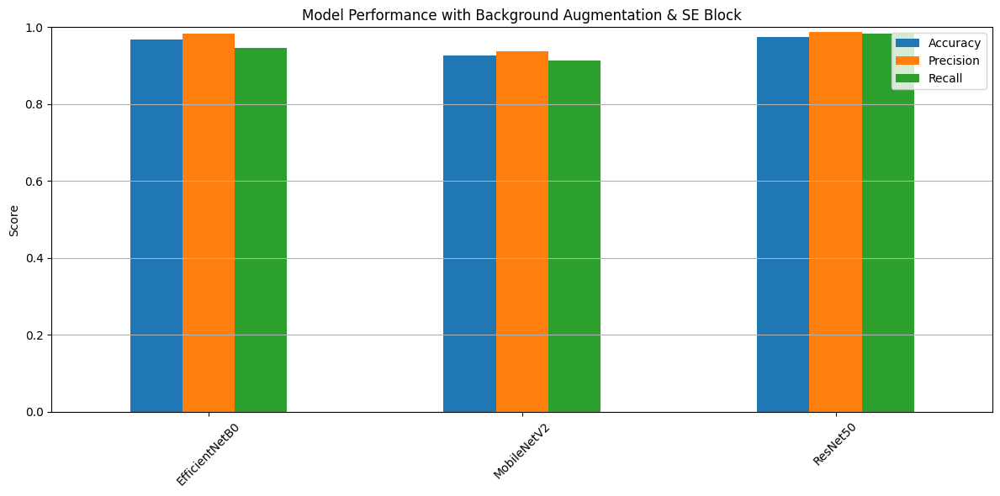


Best Model: ResNet50 (Accuracy: 97.50%)


In [17]:
# List of models and names
model_paths = {
    "EfficientNetB0": "best_model_EfficientNetB0.h5",
    "MobileNetV2": "best_model_MobileNetV2.h5",
    "ResNet50": "best_model_ResNet50.keras"
}

metrics_dict = {}

for model_name, path in model_paths.items():
    model = tf.keras.models.load_model(path)

    # Create a new generator for this model
    test_data = get_simple_generator(model_name, test_dir)

    acc, prec, rec = evaluate_model(model, test_data, model_name)
    metrics_dict[model_name] = {
        "Accuracy": acc,
        "Precision": prec,
        "Recall": rec,
    }

# Convert to DataFrame
df = pd.DataFrame(metrics_dict).T
print("\n=== Final Comparison ===")
print(df)

# Plot
df.plot(kind='bar', figsize=(12, 6), 
        title='Model Performance with Background Augmentation & SE Block')
plt.ylabel("Score")
plt.ylim(0, 1.0)
plt.xticks(rotation=45)
plt.grid(True, axis='y')
plt.tight_layout()
plt.savefig('model_comparison.png')
plt.show()

# Optional: Print best model by accuracy
best_model_name = df['Accuracy'].idxmax()
best_accuracy = df['Accuracy'].max()
print(f"\nBest Model: {best_model_name} (Accuracy: {best_accuracy:.2%})")

In [58]:
model.save(f"best_model_ResNet50.keras")

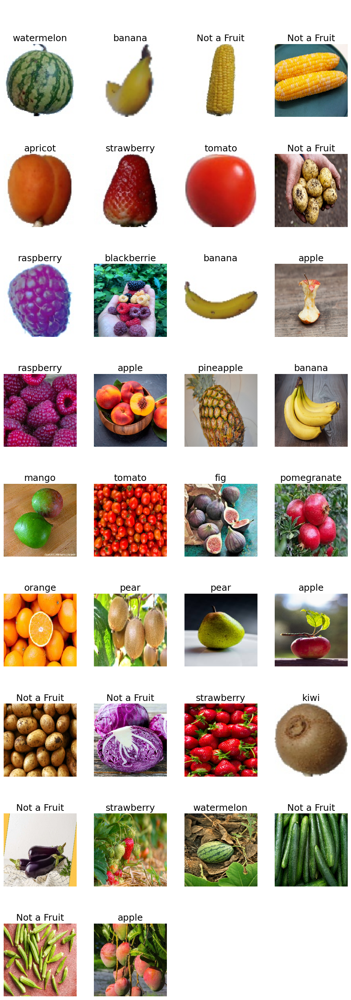

In [38]:
import os
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing import image
import tensorflow as tf

model = tf.keras.models.load_model('best_model_EfficientNetB0.h5')

class_labels = list(train_data.class_indices.keys())

custom_img_dir = 'E:/custom_test_images'

image_files = [f for f in os.listdir(custom_img_dir) if f.lower().endswith(('.png', '.jpg', '.jpeg'))]
image_paths = [os.path.join(custom_img_dir, f) for f in image_files]

plt.figure(figsize=(10, 3 * len(image_paths)))  
for i, img_path in enumerate(image_paths):
    img = image.load_img(img_path, target_size=(224, 224))  
    img_array = image.img_to_array(img)
    img_array = efficientnet_preprocess(img_array)  
    img_array = np.expand_dims(img_array, axis=0)

    prediction = model.predict(img_array, verbose=0)[0]
    max_prob = np.max(prediction)
    predicted_label = class_labels[np.argmax(prediction)] if max_prob >= 0.49 else "Not a Fruit"

    plt.subplot(len(image_paths), 4, i + 1)  
    plt.imshow(img)
    plt.axis('off')
    plt.title(f'\n\n\n{predicted_label}', fontsize=18)

plt.tight_layout()
plt.show()

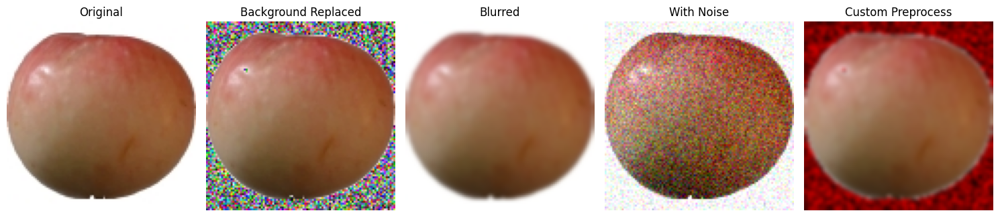

In [34]:
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing import image
import cv2

# Set your image path
img_path = 'E:/fruits-360_100x100/fruits-360/Test/apple/apple_1.jpg'  # Replace with your actual image path

# Load and convert to array
img = image.load_img(img_path, target_size=(100, 100))
img = image.img_to_array(img).astype(np.uint8)

# Apply each augmentation
img_bg = replace_background(img)
img_blur = add_blur(img)
img_noise = add_noise(img)

# Apply full custom preprocessing (with randomness)
img_custom = custom_preprocess(img.copy(), "EfficientNetB0")

# Plot the results
plt.figure(figsize=(15, 6))

titles = ["Original", "Background Replaced", "Blurred", "With Noise", "Custom Preprocess"]
images = [img, img_bg, img_blur, img_noise, img_custom]

for i, (title, im) in enumerate(zip(titles, images)):
    plt.subplot(1, 5, i + 1)
    plt.imshow(im.astype(np.uint8))
    plt.title(title, fontsize=12)
    plt.axis('off')

plt.tight_layout()
plt.show()

Found 53345 images belonging to 25 classes.


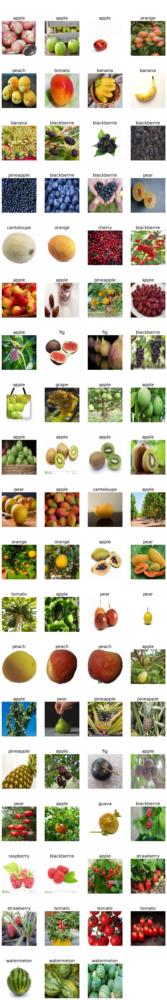

In [58]:
import os
import random
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing import image
import tensorflow as tf
from tensorflow.keras.applications.efficientnet import preprocess_input as efficientnet_preprocess

# Load your model
model = tf.keras.models.load_model('best_model_EfficientNetB0.h5')

# Load class labels
train_data = get_augmented_generator("ResNet50", train_dir)  # Ensure this is defined
class_labels = list(train_data.class_indices.keys())

# Set the directory containing class subfolders
custom_img_root = 'E:/Fruit-262'

# Collect 3 random images from each class folder
selected_images = []
for root, dirs, files in os.walk(custom_img_root):
    image_files = [f for f in files if f.lower().endswith(('.png', '.jpg', '.jpeg'))]
    if image_files:
        selected = random.sample(image_files, min(3, len(image_files)))
        selected_paths = [os.path.join(root, fname) for fname in selected]
        selected_images.extend(selected_paths)

# Plot and predict
plt.figure(figsize=(10, 3 * len(selected_images)))

for i, img_path in enumerate(selected_images):
    img = image.load_img(img_path, target_size=(224, 224))
    img_array = image.img_to_array(img)
    img_array = efficientnet_preprocess(img_array)
    img_array = np.expand_dims(img_array, axis=0)

    prediction = model.predict(img_array, verbose=0)[0]
    max_prob = np.max(prediction)
    predicted_label = class_labels[np.argmax(prediction)] 

    plt.subplot(len(selected_images), 4, i + 1)
    plt.imshow(img)
    plt.axis('off')
    plt.title(f'\n\n\n{predicted_label}', fontsize=18)

plt.tight_layout()
plt.show()